In [ ]:
# check the version of python
from platform import python_version

print(python_version())

In [ ]:
# conda install -c conda-forge movingpandas

In [2]:
# check if it works
import movingpandas as mpd
print(mpd.__version__)

0.6.rc1


In [1]:
import geopandas as gpd
print(gpd.__version__)

0.8.1


## movingpandas: create trajectory and identify significant points

In [1]:
# import the packages we need
import pandas as pd
import geopandas as gpd
import movingpandas as mpd
from shapely.geometry import Point
from datetime import datetime
from pyproj import CRS
import numpy as np
import plotly.express as px
from datetime import timedelta
import os

In [ ]:
# df=pd.read_csv('Data/london_mobile_sample.csv')
# df.head(4)

# filter out rows that muptiple users share the same location
# cleaned_df=df[df.groupby(['latitude','longitude']).device_id.transform('nunique') == 1]
# df[df.Y.map(df.groupby('Y').X.nunique()) == 1]

# # rename the column name
# cleaned_df.rename({'sdk_ts':'timestamp'}, axis='columns',inplace= True)
# cleaned_df.head(5)


# # convert to datatime
# cleaned_df['time'] = pd.to_datetime(cleaned_df['timestamp'],
#                                     utc='False')
# cleaned_df.head(2)

# # save the cleaned dataset
# import os
# path=os. getcwd() 
# out_dir = path+"/output" 
# if not os.path.exists(out_dir):
#     os.makedirs(out_dir)

# route_out = os.path.join(out_dir,"cleaned_dataset.csv" )
# cleaned_df.to_csv(route_out, index=False)

### cleaned dataset

In [2]:
cleaned_df=pd.read_csv('data/cleaned_1_8.csv')
cleaned_df

,DEVICE_ID,SDK_TS,LATITUDE,LONGITUDE,TIME
0,6ImNQNygLlDgzi6Flwiv97hAHkI=,2020-01-08 14:51:04 UTC,55.748444,-4.045884,2020-01-08 14:51:04.000
1,Uv+cyZpU1aYj0QUZU3hoVzTLoB8=,2020-01-08 00:31:40 UTC,55.858498,-3.953250,2020-01-08 00:31:40.000
2,LFyxIC2wYTjxK1TCdqnJzpn87s4=,2020-01-08 02:14:26 UTC,55.818192,-4.265124,2020-01-08 02:14:26.000
3,q3D9wVyrtdFg9r253ya+DTR8nao=,2020-01-08 05:32:44 UTC,55.890486,-4.209733,2020-01-08 05:32:44.000
4,ekKBQ2AWwMTeYJxpTkHSFpGuTdI=,2020-01-08 12:43:53 UTC,55.773655,-4.089210,2020-01-08 12:43:53.000
...,...,...,...,...,...
928572,zNKJeDFFsmOPNbzTKH4TO5JR7FQ=,2020-01-08 16:05:10 UTC,55.773460,-4.101148,2020-01-08 16:05:10.000
928573,fglXH+vtg3QPTjtt2V+IzoCIFos=,2020-01-08 05:45:21 UTC,55.783553,-4.059705,2020-01-08 05:45:21.000
928574,ueHcSPza1kwBsmotjlbzGKYM09U=,2020-01-08 14:32:15 UTC,55.820860,-4.081220,2020-01-08 14:32:15.000
928575,+Z3+5gqaAg0V0YMvc473euR1iP8=,2020-01-08 09:46:48 UTC,55.886513,-4.372357,2020-01-08 09:46:48.000


In [3]:
#check the number of user id
len(list(cleaned_df.DEVICE_ID.unique()))

8171

In [4]:
cleaned_gdf = gpd.GeoDataFrame(cleaned_df, geometry=gpd.points_from_xy(cleaned_df.LONGITUDE, cleaned_df.LATITUDE))
cleaned_gdf.set_crs(epsg=4326, inplace=True)
cleaned_gdf.to_crs(epsg=27700)

,DEVICE_ID,SDK_TS,LATITUDE,LONGITUDE,TIME,geometry
0,6ImNQNygLlDgzi6Flwiv97hAHkI=,2020-01-08 14:51:04 UTC,55.748444,-4.045884,2020-01-08 14:51:04.000,POINT (271678.956 652459.644)
1,Uv+cyZpU1aYj0QUZU3hoVzTLoB8=,2020-01-08 00:31:40 UTC,55.858498,-3.953250,2020-01-08 00:31:40.000,POINT (277838.233 664537.937)
2,LFyxIC2wYTjxK1TCdqnJzpn87s4=,2020-01-08 02:14:26 UTC,55.818192,-4.265124,2020-01-08 02:14:26.000,POINT (258173.633 660648.322)
3,q3D9wVyrtdFg9r253ya+DTR8nao=,2020-01-08 05:32:44 UTC,55.890486,-4.209733,2020-01-08 05:32:44.000,POINT (261900.557 668580.229)
4,ekKBQ2AWwMTeYJxpTkHSFpGuTdI=,2020-01-08 12:43:53 UTC,55.773655,-4.089210,2020-01-08 12:43:53.000,POINT (269044.412 655345.964)
...,...,...,...,...,...,...
928572,zNKJeDFFsmOPNbzTKH4TO5JR7FQ=,2020-01-08 16:05:10 UTC,55.773460,-4.101148,2020-01-08 16:05:10.000,POINT (268295.060 655346.944)
928573,fglXH+vtg3QPTjtt2V+IzoCIFos=,2020-01-08 05:45:21 UTC,55.783553,-4.059705,2020-01-08 05:45:21.000,POINT (270927.756 656391.908)
928574,ueHcSPza1kwBsmotjlbzGKYM09U=,2020-01-08 14:32:15 UTC,55.820860,-4.081220,2020-01-08 14:32:15.000,POINT (269703.419 660583.479)
928575,+Z3+5gqaAg0V0YMvc473euR1iP8=,2020-01-08 09:46:48 UTC,55.886513,-4.372357,2020-01-08 09:46:48.000,POINT (251716.816 668475.104)


### select one day 

In [5]:
# # filter the date we want
# start_date = "2021-04-06 00:00:00"
# end_date = "2021-04-07 00:00:00"

# after_start_date = cleaned_gdf["timestamp"] >= start_date
# before_end_date = cleaned_gdf["timestamp"] <= end_date
# between_two_dates = after_start_date & before_end_date
# filtered_dates = cleaned_gdf.loc[between_two_dates]
filtered_dates=cleaned_gdf

In [6]:
filtered_dates['time'] = pd.to_datetime(filtered_dates['SDK_TS'],
                                    utc='False')

In [7]:
# cleaned_df['time'] = pd.to_datetime(cleaned_df['timestamp'], 
#                                     format='%d/%m/%Y %H:%M:%S')

In [8]:
# #drop useless columns
# filtered_dates.drop(['accuracy','c20','device_os','device_os_version'], 
#                     axis='columns', inplace=True)

### create trajectory, start with some samples

In [9]:
# # test with some sample
# sample_df = filtered_dates.sample(n=100000)
# # len(list(sample_df.device_id.unique()))

In [10]:
# set index
sample_df=cleaned_gdf
sample_df = sample_df.set_index('time')
sample_df.head(7)

,DEVICE_ID,SDK_TS,LATITUDE,LONGITUDE,TIME,geometry
time,,,,,,
2020-01-08 14:51:04+00:00,6ImNQNygLlDgzi6Flwiv97hAHkI=,2020-01-08 14:51:04 UTC,55.748444,-4.045884,2020-01-08 14:51:04.000,POINT (-4.04588 55.74844)
2020-01-08 00:31:40+00:00,Uv+cyZpU1aYj0QUZU3hoVzTLoB8=,2020-01-08 00:31:40 UTC,55.858498,-3.953250,2020-01-08 00:31:40.000,POINT (-3.95325 55.85850)
2020-01-08 02:14:26+00:00,LFyxIC2wYTjxK1TCdqnJzpn87s4=,2020-01-08 02:14:26 UTC,55.818192,-4.265124,2020-01-08 02:14:26.000,POINT (-4.26512 55.81819)
2020-01-08 05:32:44+00:00,q3D9wVyrtdFg9r253ya+DTR8nao=,2020-01-08 05:32:44 UTC,55.890486,-4.209733,2020-01-08 05:32:44.000,POINT (-4.20973 55.89049)
2020-01-08 12:43:53+00:00,ekKBQ2AWwMTeYJxpTkHSFpGuTdI=,2020-01-08 12:43:53 UTC,55.773655,-4.089210,2020-01-08 12:43:53.000,POINT (-4.08921 55.77365)
2020-01-08 06:48:24+00:00,bDj9gLvk4txnZ8pY9forMyHtf2M=,2020-01-08 06:48:24 UTC,55.855686,-4.227116,2020-01-08 06:48:24.000,POINT (-4.22712 55.85569)
2020-01-08 00:55:42+00:00,vaAwm2Q6GKxxROPJvKGx6QzQGfY=,2020-01-08 00:55:42 UTC,55.859526,-4.402645,2020-01-08 00:55:42.000,POINT (-4.40264 55.85953)


In [11]:
# # set index
# filtered_dates = filtered_dates.set_index('time')
# filtered_dates.head(7)

In [12]:
# create collection of trajectories
minimum_length = 300 
collection = mpd.TrajectoryCollection(sample_df, 'DEVICE_ID', min_length=minimum_length) #(in meters)
#Shorter trajectories are discarded.

collection

TrajectoryCollection with 5706 trajectories

In [13]:
for trajectory in collection.trajectories:
    # Calculate speed
    trajectory.add_speed(overwrite=True)
    
    # Determine direction of movement
    trajectory.add_direction(overwrite=True)
    
    # Let's first check only the first trajectory (i.e. stop iteration after first run)
    break

In [14]:
trajectory.df.head()

,DEVICE_ID,SDK_TS,LATITUDE,LONGITUDE,TIME,geometry,speed,prev_pt,direction
time,,,,,,,,,
2020-01-08 06:52:25+00:00,++3ThZR8DQ9sqSTXgHjwj7MnuNw=,2020-01-08 06:52:25 UTC,55.813834,-4.218849,2020-01-08 06:52:25.000,POINT (-4.21885 55.81383),0.0,None,0.0
2020-01-08 06:52:30+00:00,++3ThZR8DQ9sqSTXgHjwj7MnuNw=,2020-01-08 06:52:30 UTC,55.813834,-4.218849,2020-01-08 06:52:30.000,POINT (-4.21885 55.81383),0.0,POINT (-4.21885 55.81383),0.0
2020-01-08 06:52:39+00:00,++3ThZR8DQ9sqSTXgHjwj7MnuNw=,2020-01-08 06:52:39 UTC,55.813834,-4.218849,2020-01-08 06:52:39.000,POINT (-4.21885 55.81383),0.0,POINT (-4.21885 55.81383),0.0
2020-01-08 06:52:44+00:00,++3ThZR8DQ9sqSTXgHjwj7MnuNw=,2020-01-08 06:52:44 UTC,55.813834,-4.218849,2020-01-08 06:52:44.000,POINT (-4.21885 55.81383),0.0,POINT (-4.21885 55.81383),0.0
2020-01-08 06:52:59+00:00,++3ThZR8DQ9sqSTXgHjwj7MnuNw=,2020-01-08 06:52:59 UTC,55.813834,-4.218849,2020-01-08 06:52:59.000,POINT (-4.21885 55.81383),0.0,POINT (-4.21885 55.81383),0.0


In [15]:
# plot the first trajectory
trajectory.hvplot(frame_height=400, frame_width=400)

:Overlay
   .Tiles.I :Tiles   [x,y]
   .Path.I  :Path   [Longitude,Latitude]

In [15]:
# for all trajectory

trajectories = gpd.GeoDataFrame()

i = 0
for trajectory in collection.trajectories:
    # Calculate speed
    trajectory.add_speed(overwrite=True) # meters per second, or CRS units per second
    
    # Determine direction of movement
    trajectory.add_direction(overwrite=True)
    
    # Parse time component (as datetime)
    trajectory.df["t"] = pd.to_datetime(trajectory.df["SDK_TS"])

    # Add unique id for each trajectory
    trajectory.df["tid"] = i
    
    # Add to container
    trajectories = trajectories.append(trajectory.df)
    i+=1
    
# Reorder the data based on timestamp
trajectories = trajectories.sort_values(by="t").reset_index(drop=True)

In [16]:
len(list(trajectories.tid.unique()))

5706

In [17]:
trajectories[trajectories.tid==2423]

,DEVICE_ID,SDK_TS,LATITUDE,LONGITUDE,TIME,geometry,speed,direction,prev_pt,t,tid
753,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 00:01:43 UTC,55.806452,-4.218704,2020-01-08 00:01:43.000,POINT (-4.21870 55.80645),0.000000,0.000000,None,2020-01-08 00:01:43+00:00,2423
817,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 00:01:54 UTC,55.806452,-4.218704,2020-01-08 00:01:54.000,POINT (-4.21870 55.80645),0.000000,0.000000,POINT (-4.21870 55.80645),2020-01-08 00:01:54+00:00,2423
3801,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 00:08:21 UTC,55.806452,-4.218704,2020-01-08 00:08:21.000,POINT (-4.21870 55.80645),0.000000,0.000000,POINT (-4.21870 55.80645),2020-01-08 00:08:21+00:00,2423
6305,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 00:13:40 UTC,55.806452,-4.218704,2020-01-08 00:13:40.000,POINT (-4.21870 55.80645),0.000000,0.000000,POINT (-4.21870 55.80645),2020-01-08 00:13:40+00:00,2423
10824,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 00:23:21 UTC,55.806452,-4.218705,2020-01-08 00:23:21.000,POINT (-4.21871 55.80645),0.000104,291.574837,POINT (-4.21870 55.80645),2020-01-08 00:23:21+00:00,2423
...,...,...,...,...,...,...,...,...,...,...,...
692561,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 23:41:53 UTC,55.806453,-4.218723,2020-01-08 23:41:53.000,POINT (-4.21872 55.80645),0.000000,0.000000,POINT (-4.21872 55.80645),2020-01-08 23:41:53+00:00,2423
696042,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 23:47:59 UTC,55.806453,-4.218723,2020-01-08 23:47:59.000,POINT (-4.21872 55.80645),0.000000,0.000000,POINT (-4.21872 55.80645),2020-01-08 23:47:59+00:00,2423
696150,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 23:48:11 UTC,55.806453,-4.218723,2020-01-08 23:48:11.000,POINT (-4.21872 55.80645),0.000000,0.000000,POINT (-4.21872 55.80645),2020-01-08 23:48:11+00:00,2423
697463,O4ja0BJwFZBXWx1Q+6yCYUV4MA4=,2020-01-08 23:50:22 UTC,55.806455,-4.218720,2020-01-08 23:50:22.000,POINT (-4.21872 55.80646),0.002107,36.151388,POINT (-4.21872 55.80645),2020-01-08 23:50:22+00:00,2423


In [18]:
# # Plot them all (use trajectory id to separate trajectories)
# fig = px.line_3d(trajectories, x="longitude", y="latitude", z="t", color='device_id')
# fig.update_traces(line=dict(width=5))

# # Want to get background map as well? It is possible:
# # https://chart-studio.plotly.com/~empet/14397/plotly-plot-of-a-map-from-data-available/#/

# fig.show()

### Aggregate trajectories identifying  significant points 

In [21]:
# Aggregate trajectories identifying  significant points (start and end) 
# Method description: 
#https://movingpandas.readthedocs.io/en/latest/trajectoryaggregator.html
agg = mpd.TrajectoryCollectionAggregator(collection,
                                         min_distance=300,# points will be collapsed when distance between them is lower
                                         max_distance=2000, #a representative point will be taken when the distance between location points is higher than the threshold
                                         min_stop_duration # when lower than min_duration, point will be considered as pass-by location;
                                         =timedelta(minutes=5))

In [40]:
# Get flows and clusters
flows = agg.get_flows_gdf() 
clusters = agg.get_clusters_gdf()
points = agg.get_significant_points_gdf()
type(flows)

geopandas.geodataframe.GeoDataFrame

In [41]:
import os
path=os. getcwd() 
out_dir = path+"/output" 

flows_out = os.path.join(out_dir,"flows.shp" )
clusters_out = os.path.join(out_dir,"clusters.shp" )
points_out = os.path.join(out_dir,"points.shp" )

flows.to_file(flows_out, index=False)
clusters.to_file(clusters_out, index=False)
points.to_file(points_out, index=False)

### read in the results of network

In [49]:
flows=gpd.read_file('output/flows.shp')
flows['weight_n']=flows.weight/10
flows #the number of trajectories summarized in the flow (weight)

,weight,geometry,weight_n
0,28,"LINESTRING (-4.21492 55.81312, -4.23599 55.80858)",2.8
1,47,"LINESTRING (-4.29561 55.89643, -4.28219 55.88596)",4.7
2,40,"LINESTRING (-4.28219 55.88596, -4.26863 55.86534)",4.0
3,7,"LINESTRING (-4.26863 55.86534, -4.33553 55.80399)",0.7
4,10,"LINESTRING (-4.33553 55.80399, -4.26863 55.86534)",1.0
...,...,...,...
8043,1,"LINESTRING (-4.43955 55.82711, -4.03973 55.95073)",0.1
8044,1,"LINESTRING (-4.03973 55.95073, -4.43955 55.82711)",0.1
8045,1,"LINESTRING (-4.27117 55.78248, -4.22683 55.75376)",0.1
8046,1,"LINESTRING (-4.22683 55.75376, -4.16134 55.75902)",0.1


In [50]:
clusters=gpd.read_file('output/clusters.shp')
clusters['n_n']=clusters.n/10
clusters #the number of clustered significant points (n)

,n,geometry,n_n
0,264,POINT (-4.23599 55.80858),26.4
1,372,POINT (-4.28219 55.88596),37.2
2,1683,POINT (-4.26863 55.86534),168.3
3,451,POINT (-4.33553 55.80399),45.1
4,349,POINT (-4.25946 55.88267),34.9
...,...,...,...
509,4,POINT (-3.89290 55.61625),0.4
510,1,POINT (-3.70257 55.77777),0.1
511,2,POINT (-3.55570 55.67565),0.2
512,2,POINT (-3.56005 55.75032),0.2


In [51]:
points=gpd.read_file('output/points.shp')

points #extracted significant points

,FID,geometry
0,0,POINT (-4.21885 55.81383)
1,1,POINT (-4.23233 55.80721)
2,2,POINT (-4.28844 55.90184)
3,3,POINT (-4.28844 55.90184)
4,4,POINT (-4.28844 55.90185)
...,...,...
70608,70608,POINT (-4.22364 55.74783)
70609,70609,POINT (-3.88314 55.75247)
70610,70610,POINT (-3.88329 55.75248)
70611,70611,POINT (-4.40135 55.89817)


In [54]:
# Plot with Holoviews
( flows.hvplot(title='Generalized aggregated trajectories',
               geo=True, hover_cols=['weight_n'], line_width='weight_n',
               alpha=0.5, color='#1f77b3', tiles='OSM', frame_height=400, 
               frame_width=400) * clusters.hvplot(geo=True, color='red', size='n_n') )

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Path.I   :Path   [Longitude,Latitude]   (weight_n)
   .Points.I :Points   [Longitude,Latitude]   (n_n)

In [55]:
# Plot with Holoviews
( flows.hvplot(title='Generalized aggregated trajectories',
               geo=True, hover_cols=['weight_n'], line_width='weight_n',
               alpha=0.5, color='#1f77b3', tiles='OSM', frame_height=400, 
               frame_width=400) * points.hvplot(geo=True, color='red', size=5) )

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Path.I   :Path   [Longitude,Latitude]   (weight_n)
   .Points.I :Points   [Longitude,Latitude]

### network (build a edgelist)

In [56]:
# build a network from flow
import networkx as nx

flows['points'] = flows.apply(lambda x: [y for y in x['geometry'].coords], axis=1)
flows

,weight,geometry,weight_n,points
0,28,"LINESTRING (-4.21492 55.81312, -4.23599 55.80858)",2.8,"[(-4.214923173944102, 55.81311705534164), (-4...."
1,47,"LINESTRING (-4.29561 55.89643, -4.28219 55.88596)",4.7,"[(-4.295609261715326, 55.89642841437953), (-4...."
2,40,"LINESTRING (-4.28219 55.88596, -4.26863 55.86534)",4.0,"[(-4.282193628197532, 55.885964336518576), (-4..."
3,7,"LINESTRING (-4.26863 55.86534, -4.33553 55.80399)",0.7,"[(-4.26862644251172, 55.86533854937923), (-4.3..."
4,10,"LINESTRING (-4.33553 55.80399, -4.26863 55.86534)",1.0,"[(-4.335528159495794, 55.80398926510508), (-4...."
...,...,...,...,...
8043,1,"LINESTRING (-4.43955 55.82711, -4.03973 55.95073)",0.1,"[(-4.439547467372015, 55.827106698532425), (-4..."
8044,1,"LINESTRING (-4.03973 55.95073, -4.43955 55.82711)",0.1,"[(-4.039731142147648, 55.95073151684559), (-4...."
8045,1,"LINESTRING (-4.27117 55.78248, -4.22683 55.75376)",0.1,"[(-4.271171081408451, 55.78247728577463), (-4...."
8046,1,"LINESTRING (-4.22683 55.75376, -4.16134 55.75902)",0.1,"[(-4.226834972198277, 55.75375903698275), (-4...."


In [57]:
# extract origin and destination from linestring
flows['origin'] = [i[0] for i in flows['points']]
flows['target'] = [i[1] for i in flows['points']]

In [58]:
flows

,weight,geometry,weight_n,points,origin,target
0,28,"LINESTRING (-4.21492 55.81312, -4.23599 55.80858)",2.8,"[(-4.214923173944102, 55.81311705534164), (-4....","(-4.214923173944102, 55.81311705534164)","(-4.235988358683387, 55.80857704896553)"
1,47,"LINESTRING (-4.29561 55.89643, -4.28219 55.88596)",4.7,"[(-4.295609261715326, 55.89642841437953), (-4....","(-4.295609261715326, 55.89642841437953)","(-4.282193628197532, 55.885964336518576)"
2,40,"LINESTRING (-4.28219 55.88596, -4.26863 55.86534)",4.0,"[(-4.282193628197532, 55.885964336518576), (-4...","(-4.282193628197532, 55.885964336518576)","(-4.26862644251172, 55.86533854937923)"
3,7,"LINESTRING (-4.26863 55.86534, -4.33553 55.80399)",0.7,"[(-4.26862644251172, 55.86533854937923), (-4.3...","(-4.26862644251172, 55.86533854937923)","(-4.335528159495794, 55.80398926510508)"
4,10,"LINESTRING (-4.33553 55.80399, -4.26863 55.86534)",1.0,"[(-4.335528159495794, 55.80398926510508), (-4....","(-4.335528159495794, 55.80398926510508)","(-4.26862644251172, 55.86533854937923)"
...,...,...,...,...,...,...
8043,1,"LINESTRING (-4.43955 55.82711, -4.03973 55.95073)",0.1,"[(-4.439547467372015, 55.827106698532425), (-4...","(-4.439547467372015, 55.827106698532425)","(-4.039731142147648, 55.95073151684559)"
8044,1,"LINESTRING (-4.03973 55.95073, -4.43955 55.82711)",0.1,"[(-4.039731142147648, 55.95073151684559), (-4....","(-4.039731142147648, 55.95073151684559)","(-4.439547467372015, 55.827106698532425)"
8045,1,"LINESTRING (-4.27117 55.78248, -4.22683 55.75376)",0.1,"[(-4.271171081408451, 55.78247728577463), (-4....","(-4.271171081408451, 55.78247728577463)","(-4.226834972198277, 55.75375903698275)"
8046,1,"LINESTRING (-4.22683 55.75376, -4.16134 55.75902)",0.1,"[(-4.226834972198277, 55.75375903698275), (-4....","(-4.226834972198277, 55.75375903698275)","(-4.161339962668617, 55.75902221011734)"


In [59]:
# # reverse key and value 
# o_map = {value : key for (key, value) in o_map['origin'].items()}
# d_map = {value : key for (key, value) in d_map['target'].items()}

### network!

In [60]:
# network !!
g_OD = nx.from_pandas_edgelist(flows, 'origin', 'target',['weight'])
list(g_OD.edges(data=True))[:3]
# # get position
# pos_shp = {xy: xy for xy in g_OD.nodes()}

[((-4.214923173944102, 55.81311705534164),
  (-4.235988358683387, 55.80857704896553),
  {'weight': 33}),
 ((-4.214923173944102, 55.81311705534164),
  (-4.227173827352686, 55.86197222538249),
  {'weight': 1}),
 ((-4.214923173944102, 55.81311705534164),
  (-3.9654388476300566, 55.74657287514439),
  {'weight': 1})]

In [61]:
# Create a new attribute with node coordinates (now coord are the keys and we do not want to lose that information
nod_coord = {(e1):e1 for e1 in g_OD.nodes()}
nx.set_node_attributes(g_OD,nod_coord,'point_location')
list(g_OD.nodes(data=True))[0:2]

[((-4.214923173944102, 55.81311705534164),
  {'point_location': (-4.214923173944102, 55.81311705534164)}),
 ((-4.235988358683387, 55.80857704896553),
  {'point_location': (-4.235988358683387, 55.80857704896553)})]

In [62]:
# now relabel each node with an ordered integer:
node_list = list(g_OD.nodes())
mapping = {node_list[i]:i for i in range(len(node_list))}
g_OD = nx.relabel_nodes(g_OD, mapping)
list(g_OD.nodes(data=True))

[(0, {'point_location': (-4.214923173944102, 55.81311705534164)}),
 (1, {'point_location': (-4.235988358683387, 55.80857704896553)}),
 (2, {'point_location': (-4.295609261715326, 55.89642841437953)}),
 (3, {'point_location': (-4.282193628197532, 55.885964336518576)}),
 (4, {'point_location': (-4.26862644251172, 55.86533854937923)}),
 (5, {'point_location': (-4.335528159495794, 55.80398926510508)}),
 (6, {'point_location': (-4.267561262033898, 55.89793688076273)}),
 (7, {'point_location': (-4.593052147758621, 55.94891701327585)}),
 (8, {'point_location': (-4.57134623959184, 55.94270867210887)}),
 (9, {'point_location': (-4.555868077153556, 55.94918130636705)}),
 (10, {'point_location': (-4.279444476117648, 55.854998076635255)}),
 (11, {'point_location': (-4.2529504891812415, 55.860187290182395)}),
 (12, {'point_location': (-4.29709298088353, 55.87282162885558)}),
 (13, {'point_location': (-4.322558052894738, 55.915256487842136)}),
 (14, {'point_location': (-4.409342116570885, 55.9062931

In [63]:
list(g_OD.edges(data=True))[:3]

[(0, 1, {'weight': 33}), (0, 60, {'weight': 1}), (0, 68, {'weight': 1})]

In [64]:
# set edge attribute with coordinates
edg_coord1={(e1,e2):(g_OD.nodes[e1]['point_location']) for e1, e2 in g_OD.edges()}
edg_coord2={(e1,e2):(g_OD.nodes[e2]['point_location']) for e1, e2 in g_OD.edges()}

nx.set_edge_attributes(g_OD,edg_coord1,'origin_coord')
nx.set_edge_attributes(g_OD,edg_coord2,'target_coord')
list(g_OD.edges(data=True))[:3]

[(0,
  1,
  {'weight': 33,
   'origin_coord': (-4.214923173944102, 55.81311705534164),
   'target_coord': (-4.235988358683387, 55.80857704896553)}),
 (0,
  60,
  {'weight': 1,
   'origin_coord': (-4.214923173944102, 55.81311705534164),
   'target_coord': (-4.227173827352686, 55.86197222538249)}),
 (0,
  68,
  {'weight': 1,
   'origin_coord': (-4.214923173944102, 55.81311705534164),
   'target_coord': (-3.9654388476300566, 55.74657287514439)})]

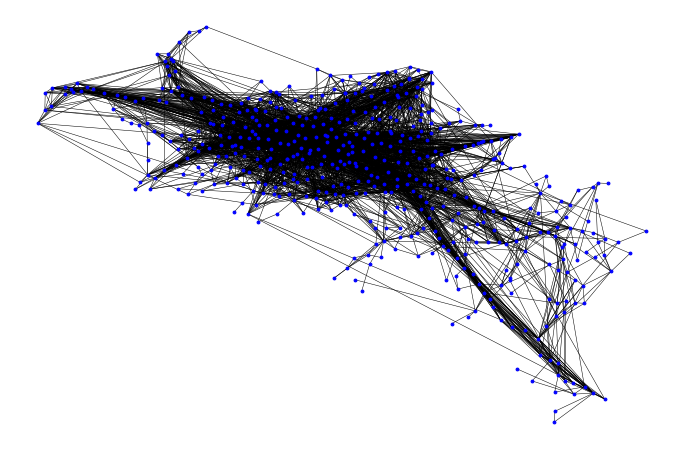

In [65]:
# plot the network!


pos = {e1: xy for e1,xy in g_OD.nodes(data='point_location')}

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(12,8))
nx.draw_networkx_nodes(g_OD,pos,node_size=8,node_color='b')
nx.draw_networkx_edges(g_OD,pos,arrows=False,width=0.5)
plt.axis("off")
plt.show()

In [66]:
# save the network to shp
df = nx.to_pandas_edgelist(g_OD)
#to_pandas_edgelist(Graph, source='source', target='target', nodelist=None, dtype=None, order=None)

df.head(3)

,source,target,target_coord,origin_coord,weight
0,0,1,"(-4.235988358683387, 55.80857704896553)","(-4.214923173944102, 55.81311705534164)",33
1,0,60,"(-4.227173827352686, 55.86197222538249)","(-4.214923173944102, 55.81311705534164)",1
2,0,68,"(-3.9654388476300566, 55.74657287514439)","(-4.214923173944102, 55.81311705534164)",1


In [67]:
import os
path=os. getcwd() 
out_dir = path+"/output" 
route_out = os.path.join(out_dir,"weighed_network.csv" )
df.to_csv(route_out, index=False)

### matrix: inflow and outflow

In [68]:
# read in the weighed network to dataframe
df=pd.read_csv('output/weighed_network.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5621 entries, 0 to 5620
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   source        5621 non-null   int64 
 1   target        5621 non-null   int64 
 2   target_coord  5621 non-null   object
 3   origin_coord  5621 non-null   object
 4   weight        5621 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 219.7+ KB


In [69]:
# # calculate the in-flow and out-flow

# df['outflow']=df.groupby('source')['weight'].transform('sum')
# df['inflow']=df.groupby('target')['weight'].transform('sum')
# df

In [70]:
outflow=df.groupby(['source','origin_coord']).weight.agg(['sum']).reset_index()
inflow=df.groupby(['target','target_coord']).weight.agg(['sum']).reset_index()
outflow.head(2)

# convert data type from str to list
inflow.target_coord= inflow.target_coord.str.replace('(','')
inflow.target_coord= inflow.target_coord.str.replace(')','')
inflow.target_coord= inflow.target_coord.str.split(',')
# convert data type from str to list
outflow.origin_coord= outflow.origin_coord.str.replace('(','')
outflow.origin_coord= outflow.origin_coord.str.replace(')','')
outflow.origin_coord= outflow.origin_coord.str.split(',')
outflow

#extract lat and lon
outflow['lon']=0
outflow['lat']=0

for i in outflow.index:
    outflow['lon'][i]=outflow['origin_coord'][i][0] 
    outflow['lat'][i]=outflow['origin_coord'][i][1] 
outflow

#extract lat and lon
inflow['lon']=0
inflow['lat']=0

for i in inflow.index:
    inflow['lon'][i]=inflow['target_coord'][i][0] 
    inflow['lat'][i]=inflow['target_coord'][i][1] 


# set geometry
inflow = gpd.GeoDataFrame(
    inflow, geometry=gpd.points_from_xy(inflow.lon, inflow.lat,crs="EPSG:4326"))

outflow = gpd.GeoDataFrame(
    outflow, geometry=gpd.points_from_xy(outflow.lon, outflow.lat,crs="EPSG:4326"))

outflow

<ipython-input-70-d1e4b5992d7e>:6: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  inflow.target_coord= inflow.target_coord.str.replace('(','')
<ipython-input-70-d1e4b5992d7e>:7: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  inflow.target_coord= inflow.target_coord.str.replace(')','')
<ipython-input-70-d1e4b5992d7e>:10: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  outflow.origin_coord= outflow.origin_coord.str.replace('(','')
<ipython-input-70-d1e4b5992d7e>:11: FutureWarning: The default value of regex will change from True 

,source,origin_coord,sum,lon,lat,geometry
0,0,"[-4.214923173944102, 55.81311705534164]",201,-4.214923173944102,55.81311705534164,POINT (-4.21492 55.81312)
1,1,"[-4.235988358683387, 55.80857704896553]",107,-4.235988358683387,55.80857704896553,POINT (-4.23599 55.80858)
2,2,"[-4.295609261715326, 55.89642841437953]",132,-4.295609261715326,55.89642841437953,POINT (-4.29561 55.89643)
3,3,"[-4.282193628197532, 55.885964336518576]",214,-4.282193628197532,55.885964336518576,POINT (-4.28219 55.88596)
4,4,"[-4.26862644251172, 55.86533854937923]",897,-4.26862644251172,55.86533854937923,POINT (-4.26863 55.86534)
...,...,...,...,...,...,...
424,492,"[-4.626835333333333, 55.820726]",1,-4.626835333333333,55.820726,POINT (-4.62684 55.82073)
425,493,"[-4.627262249999999, 55.851584]",1,-4.627262249999999,55.851584,POINT (-4.62726 55.85158)
426,494,"[-4.648001285714286, 55.88285928571428]",8,-4.648001285714286,55.88285928571428,POINT (-4.64800 55.88286)
427,495,"[-4.666843062500001, 55.885738062499996]",7,-4.666843062500001,55.885738062499996,POINT (-4.66684 55.88574)


<AxesSubplot:>

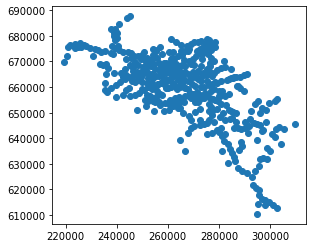

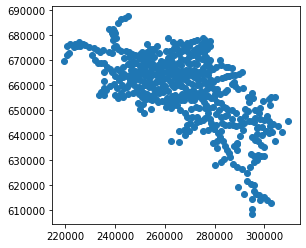

In [71]:
outflow=outflow.to_crs("EPSG:27700")
outflow.plot()

inflow=inflow.to_crs("EPSG:27700")
inflow.plot()

### join values to polygon

In [73]:
# load in ward data
glasgow_district = gpd.read_file(f"data/BoundaryData/scotland_pcd_2012.shp")
#london_wards.info()
# london_wards.set_crs('epsg:4326')
glasgow_district=glasgow_district.to_crs('epsg:27700')
glasgow_district.crs

<Projected CRS: EPSG:27700>
Name: OSGB 1936 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: OSGB 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

<AxesSubplot:>

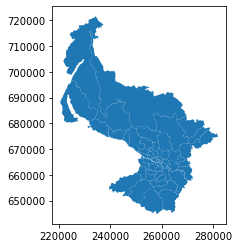

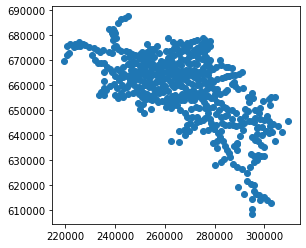

In [74]:
glasgow_district.plot()
inflow.plot()

In [80]:
mass_outflow = gpd.sjoin(outflow,glasgow_district, 
                         how="right", 
                         op='within')
mass_outflow

,index_left,source,origin_coord,sum,lon,lat,name,label,geometry
0,137.0,137.0,"[-4.3701455548387065, 55.89087417096776]",19.0,-4.3701455548387065,55.89087417096776,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66..."
0,52.0,52.0,"[-4.324103335090908, 55.89205337032321]",115.0,-4.324103335090908,55.89205337032321,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66..."
0,15.0,15.0,"[-4.379691978565218, 55.896676600608615]",169.0,-4.379691978565218,55.896676600608615,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66..."
1,NaN,NaN,NaN,NaN,NaN,NaN,None,G34,"POLYGON ((267042.709 667535.799, 267038.562 66..."
2,142.0,142.0,"[-4.280465084621996, 55.827645416185604]",118.0,-4.280465084621996,55.827645416185604,None,G41,"POLYGON ((254286.989 662236.986, 254305.013 66..."
...,...,...,...,...,...,...,...,...,...
48,374.0,397.0,"[-4.6040187, 56.00853609090909]",5.0,-4.6040187,56.00853609090909,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71..."
48,386.0,412.0,"[-4.5519609, 56.02961782499999]",2.0,-4.5519609,56.02961782499999,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71..."
48,393.0,426.0,"[-4.505202000000001, 56.0494915]",2.0,-4.505202000000001,56.0494915,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71..."
48,387.0,413.0,"[-4.487298551666667, 56.056482435]",1.0,-4.487298551666667,56.056482435,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71..."


In [81]:
mass_inflow = gpd.sjoin(inflow,glasgow_district, 
                         how="right", 
                         op='within')
mass_inflow

,index_left,target,target_coord,sum,lon,lat,name,label,geometry
0,133.0,137.0,"[-4.3701455548387065, 55.89087417096776]",188.0,-4.3701455548387065,55.89087417096776,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66..."
0,12.0,15.0,"[-4.379691978565218, 55.896676600608615]",13.0,-4.379691978565218,55.896676600608615,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66..."
0,48.0,52.0,"[-4.324103335090908, 55.89205337032321]",144.0,-4.324103335090908,55.89205337032321,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66..."
1,308.0,314.0,"[-4.101861534210526, 55.870084271052605]",51.0,-4.101861534210526,55.870084271052605,None,G34,"POLYGON ((267042.709 667535.799, 267038.562 66..."
2,138.0,142.0,"[-4.280465084621996, 55.827645416185604]",103.0,-4.280465084621996,55.827645416185604,None,G41,"POLYGON ((254286.989 662236.986, 254305.013 66..."
...,...,...,...,...,...,...,...,...,...
48,419.0,427.0,"[-4.529564881818182, 56.046816118181816]",9.0,-4.529564881818182,56.046816118181816,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71..."
48,418.0,426.0,"[-4.505202000000001, 56.0494915]",2.0,-4.505202000000001,56.0494915,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71..."
48,389.0,397.0,"[-4.6040187, 56.00853609090909]",10.0,-4.6040187,56.00853609090909,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71..."
48,405.0,413.0,"[-4.487298551666667, 56.056482435]",4.0,-4.487298551666667,56.056482435,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71..."


In [82]:
mass_outflow['sum_ward']= mass_outflow.groupby('label')['sum'].transform('sum')
mass_outflow

mass_inflow['sum_ward']= mass_inflow.groupby('label')['sum'].transform('sum')
mass_inflow

# flow.plot(column='sum',cmap='Blues', scheme='FisherJenks',
#                figsize=(25, 15),linewidth=0.2, edgecolor='grey',legend=True)
# # plt.savefig('health.png',dpi=100)

,index_left,target,target_coord,sum,lon,lat,name,label,geometry,sum_ward
0,133.0,137.0,"[-4.3701455548387065, 55.89087417096776]",188.0,-4.3701455548387065,55.89087417096776,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66...",345.0
0,12.0,15.0,"[-4.379691978565218, 55.896676600608615]",13.0,-4.379691978565218,55.896676600608615,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66...",345.0
0,48.0,52.0,"[-4.324103335090908, 55.89205337032321]",144.0,-4.324103335090908,55.89205337032321,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66...",345.0
1,308.0,314.0,"[-4.101861534210526, 55.870084271052605]",51.0,-4.101861534210526,55.870084271052605,None,G34,"POLYGON ((267042.709 667535.799, 267038.562 66...",51.0
2,138.0,142.0,"[-4.280465084621996, 55.827645416185604]",103.0,-4.280465084621996,55.827645416185604,None,G41,"POLYGON ((254286.989 662236.986, 254305.013 66...",103.0
...,...,...,...,...,...,...,...,...,...,...
48,419.0,427.0,"[-4.529564881818182, 56.046816118181816]",9.0,-4.529564881818182,56.046816118181816,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71...",175.0
48,418.0,426.0,"[-4.505202000000001, 56.0494915]",2.0,-4.505202000000001,56.0494915,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71...",175.0
48,389.0,397.0,"[-4.6040187, 56.00853609090909]",10.0,-4.6040187,56.00853609090909,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71...",175.0
48,405.0,413.0,"[-4.487298551666667, 56.056482435]",4.0,-4.487298551666667,56.056482435,None,G83,"POLYGON ((227790.974 718015.989, 228228.993 71...",175.0


<ipython-input-94-cb34f1064a56>:13: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


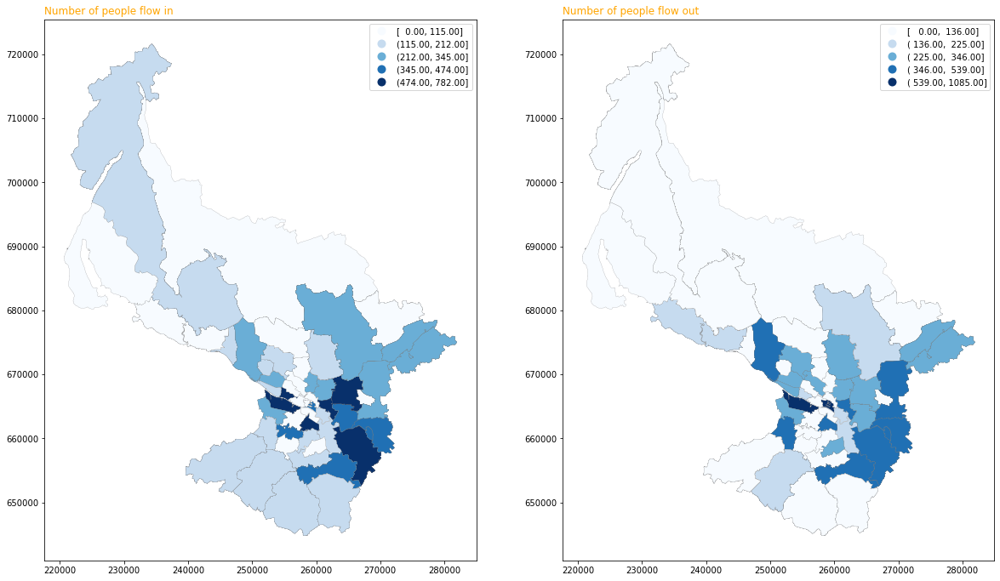

In [94]:
import matplotlib.pyplot as plt

fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(20, 16))
# title
ax1.set_title("Number of people flow in", loc='left', fontsize=12, fontweight=0, color='orange')
ax2.set_title("Number of people flow out", loc='left', fontsize=12, fontweight=0, color='orange')
# map
ax1 = mass_inflow.plot(ax=ax1, column='sum_ward', legend=True,label='inflow',
                       cmap='Blues',scheme='FisherJenks',linewidth=0.2, edgecolor='grey')
ax2 = mass_outflow.plot(ax=ax2, column='sum_ward', legend=True,label='outflow',
                        cmap='Blues',scheme='FisherJenks',linewidth=0.2, edgecolor='grey')

fig.show()

In [93]:
# mass_inflow.plot(column='sum_ward',cmap='Blues', scheme='FisherJenks',label='inflow',
#                figsize=(15, 10),linewidth=0.2, edgecolor='grey',legend=True)
# # plt.savefig('health.png',dpi=100)
# mass_outflow.plot(column='sum_ward',cmap='Blues', scheme='FisherJenks',
#                figsize=(15, 10),linewidth=0.2, edgecolor='grey',legend=True)

In [83]:
# # adj_matrix = nx.adjacency_matrix(g_OD)
# adj_matrix = nx.to_numpy_matrix(g_OD,weight='weight')
# matrix=pd.DataFrame(adj_matrix)

In [84]:
# matrix['Total'] = matrix.sum(axis=1)
# matrix.loc['Total']= matrix.sum()
# matrix

### glasgow

In [143]:
# load in ward data
glasgow_district = gpd.read_file(f"data/BoundaryData/scotland_pcd_2012.shp")
#london_wards.info()
# london_wards.set_crs('epsg:4326')
glasgow_district=glasgow_district.to_crs('epsg:27700')
glasgow_district.crs

<AxesSubplot:>

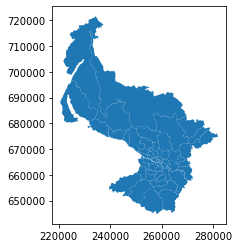

In [129]:
glasgow_district.plot()

In [148]:
glasgow_district.head(3)

,name,label,geometry
0,None,G13,"POLYGON ((250983.589 669110.208, 250983.993 66..."
1,None,G34,"POLYGON ((267042.709 667535.799, 267038.562 66..."
2,None,G41,"POLYGON ((254286.989 662236.986, 254305.013 66..."


<AxesSubplot:>

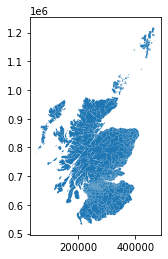

In [130]:
scottish_wards = gpd.read_file(f"data/Scotland_wa_2001/scotland_wa_2001.shp")
#london_wards.info()
# london_wards.set_crs('epsg:4326')
scottish_wards=scottish_wards.to_crs('epsg:27700')
scottish_wards.plot()

In [149]:
scottish_wards.head(3)

,name,label,geometry
0,Ardnamurchan and Morvern,1876,"POLYGON ((201177.722 764152.636, 201187.187 76..."
1,Kilmallie and Invergarry,1874,"POLYGON ((207736.000 776567.000, 207647.000 77..."
2,Highland,3017,"POLYGON ((257956.980 733438.512, 257967.439 73..."


In [141]:
Glasgow=scottish_wards[scottish_wards.name=='Glasgow City']
Glasgow

,name,label,geometry


<AxesSubplot:>

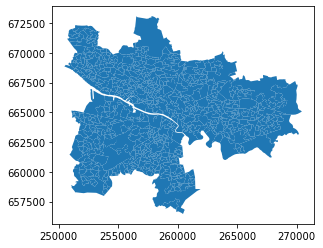

In [145]:
# load in ward data
Glasgow_Population = gpd.read_file(f"data/Glasgow_Population/Glasgow_Population.shp")
#london_wards.info()
# london_wards.set_crs('epsg:4326')
Glasgow_Population=Glasgow_Population.to_crs('epsg:27700')
Glasgow_Population.plot()

In [146]:
Glasgow_Population

,DataZone,StdAreaHa,StdAreaKm2,Shape_Leng,Shape_Area,Area_name,Council_ar,Population,geometry
0,S01009758,7.849029,0.078491,1474.152028,78490.309008,Darnley East - 01,Glasgow City,597.0,"POLYGON ((254366.687 658648.165, 254302.649 65..."
1,S01009759,13.609150,0.136092,2170.701472,136091.515542,Darnley East - 02,Glasgow City,874.0,"POLYGON ((254197.000 660082.000, 254187.000 66..."
2,S01009760,33.234507,0.332345,3057.747139,332345.088422,Darnley East - 03,Glasgow City,818.0,"POLYGON ((254419.100 659330.500, 254431.196 65..."
3,S01009761,15.607803,0.156078,2761.244322,156078.015080,Darnley East - 04,Glasgow City,804.0,"POLYGON ((254085.000 658830.000, 254073.000 65..."
4,S01009762,15.073786,0.150739,2295.018993,150737.851165,Darnley East - 05,Glasgow City,1266.0,"POLYGON ((253971.926 659497.041, 253975.149 65..."
...,...,...,...,...,...,...,...,...,...
741,S01010499,24.494158,0.244941,2645.822578,244941.600066,Drumry East - 04,Glasgow City,793.0,"POLYGON ((251775.000 671648.000, 251833.000 67..."
742,S01010500,21.830305,0.218304,2793.013024,218303.033646,Drumry West - 01,Glasgow City,984.0,"POLYGON ((251511.000 671262.000, 251522.001 67..."
743,S01010501,23.383030,0.233831,3413.705002,233830.299216,Drumry West - 02,Glasgow City,1124.0,"POLYGON ((251627.000 671643.000, 251610.000 67..."
744,S01010502,24.142424,0.241424,2732.532929,241424.225068,Drumry West - 03,Glasgow City,788.0,"POLYGON ((251100.354 672000.127, 251110.987 67..."


In [ ]:
import geopandas as gpd
from shapely.geometry import Polygon
import numpy as np
points = gpd.read_file('points.shp')
xmin,ymin,xmax,ymax =  points.total_bounds
width = 2000
height = 1000
rows = int(np.ceil((ymax-ymin) /  height))
cols = int(np.ceil((xmax-xmin) / width))
XleftOrigin = xmin
XrightOrigin = xmin + width
YtopOrigin = ymax
YbottomOrigin = ymax- height
polygons = []
for i in range(cols):
    Ytop = YtopOrigin
    Ybottom =YbottomOrigin
    for j in range(rows):
        polygons.append(Polygon([(XleftOrigin, Ytop), (XrightOrigin, Ytop), (XrightOrigin, Ybottom), (XleftOrigin, Ybottom)])) 
        Ytop = Ytop - height
        Ybottom = Ybottom - height
    XleftOrigin = XleftOrigin + width
    XrightOrigin = XrightOrigin + width
    
grid = gpd.GeoDataFrame({'geometry':polygons})
grid.to_file("grid.shp")

In [ ]:
import geopandas as gpd
from shapely.geometry import Polygon
import numpy as np
points = gpd.read_file('points.shp')

xmin, ymin, xmax, ymax = points.total_bounds

length = 1000
wide = 1200

cols = list(np.arange(xmin, xmax + wide, wide))
rows = list(np.arange(ymin, ymax + length, length))

polygons = []
for x in cols[:-1]:
    for y in rows[:-1]:
        polygons.append(Polygon([(x,y), (x+wide, y), (x+wide, y+length), (x, y+length)]))

grid = gpd.GeoDataFrame({'geometry':polygons})
grid.to_file("grid.shp")